In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from time import time
from sklearn.metrics.cluster import normalized_mutual_info_score
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture as EM
from sklearn.model_selection import learning_curve
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.datasets import load_breast_cancer

# Clustering Algorithm

## K-means 

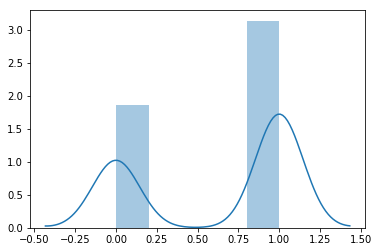

(569, 30)


In [2]:
X = load_breast_cancer().data
y = load_breast_cancer().target
def normalize(dataset):
    dataNorm=((dataset-dataset.min())/(dataset.max()-dataset.min()))*20
    return dataNorm
X = normalize(X)
ax = sns.distplot(y)
plt.show()
X_norm = X
print(X.shape)

## How to evalute the clustering algorithm performance?
Evaluating the performance of a clustering algorithm is not as trivial as counting the number of errors or the precision and recall of a supervised classification algorithm. In particular any evaluation metric should not take the absolute values of the cluster labels into account but rather if this clustering define separations of the data similar to some ground truth set of classes or satisfying some assumption such that members belong to the same class are more similar that members of different classes according to some similarity metric.

https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation  
https://stats.stackexchange.com/questions/79028/performance-metrics-to-evaluate-unsupervised-learning

In [3]:
def visialize(X,y):
    LABEL_COLOR_MAP = {0 : 'k',
                   1 : 'red',
                   2 : 'tan',
                   3 : 'green',
                   4 : 'navy',
                   5 : 'plum',
                   6 : 'yellow',
                   7 : 'lightgrey',
                   }
    label_color = [LABEL_COLOR_MAP[l] for l in y]
    for i in range(29):
        for j in range(i,30):
            centers = kmeans.cluster_centers_
            plt.scatter( X.iloc[:, i], X.iloc[:, j],c = label_color,s = 1)
       
            plt.xlabel(list(X.columns.values)[i])
            plt.ylabel(list(X.columns.values)[j])
            plt.title("Wine: plot on projected space")
            plt.savefig("./figures/wine/%s_%s.jpg"%(num,i,j))
            plt.show()

**To visualize, I project the points to 2-D space, I tried every combination of 2-D axises to find the best visualization**  
**All the figures are in figures/wine/ folder**

In [4]:
def K_MEANS(X_norm,y,ss):
    for num in range(2,9):
        print("---------------k = ",num," ------------")
        kmeans = KMeans(n_clusters=num) 
        kmeans.fit(X_norm)
        #visialize_clustering(kmeans,num)
        print("Adjusted Rand index: ",metrics.adjusted_rand_score(np.array(y), kmeans.labels_))
        print("Homogeneity: ",metrics.homogeneity_score(np.array(y), kmeans.labels_))
        print("completeness: ",metrics.completeness_score(np.array(y), kmeans.labels_))
        print("V-measure: ",metrics.v_measure_score(np.array(y), kmeans.labels_))
        print("Mutual Information: ",metrics.adjusted_mutual_info_score(np.array(y), kmeans.labels_))
        print("Silhouette Coefficient: ",metrics.silhouette_score(X_norm,kmeans.labels_, metric='euclidean'))

    for n_clusters in range(2,9):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.25,0.7])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_norm) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10).fit(X_norm)
        cluster_labels = clusterer.labels_
        print("NMI score: %.6f" % normalized_mutual_info_score(y, cluster_labels))

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X_norm, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_norm, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.25, 0, 0.2, 0.4, 0.6, 0.7])

        # 2nd Plot showing the actual clusters formed
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter( X_norm[:, 0], X_norm[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_

        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
        plt.savefig("./figures/cancer/%s/K=%s.jpg"%(ss,n_clusters))
        plt.show()

---------------k =  2  ------------
Adjusted Rand index:  0.491424536225
Homogeneity:  0.42229071247
completeness:  0.516808997281
V-measure:  0.464793327922
Mutual Information:  0.421517415982
Silhouette Coefficient:  0.697264615606
---------------k =  3  ------------
Adjusted Rand index:  0.539072690504
Homogeneity:  0.491437293715
completeness:  0.452036918106
V-measure:  0.470914407431
Mutual Information:  0.450676630991
Silhouette Coefficient:  0.646764215965
---------------k =  4  ------------
Adjusted Rand index:  0.412743146718
Homogeneity:  0.575050321417
completeness:  0.333276642209
V-measure:  0.421986460598
Mutual Information:  0.331708940063
Silhouette Coefficient:  0.533461473712
---------------k =  5  ------------
Adjusted Rand index:  0.341809839187
Homogeneity:  0.601928494154
completeness:  0.297757790973
V-measure:  0.398425321594
Mutual Information:  0.295870830173
Silhouette Coefficient:  0.510229299791
---------------k =  6  ------------
Adjusted Rand index:  0.3

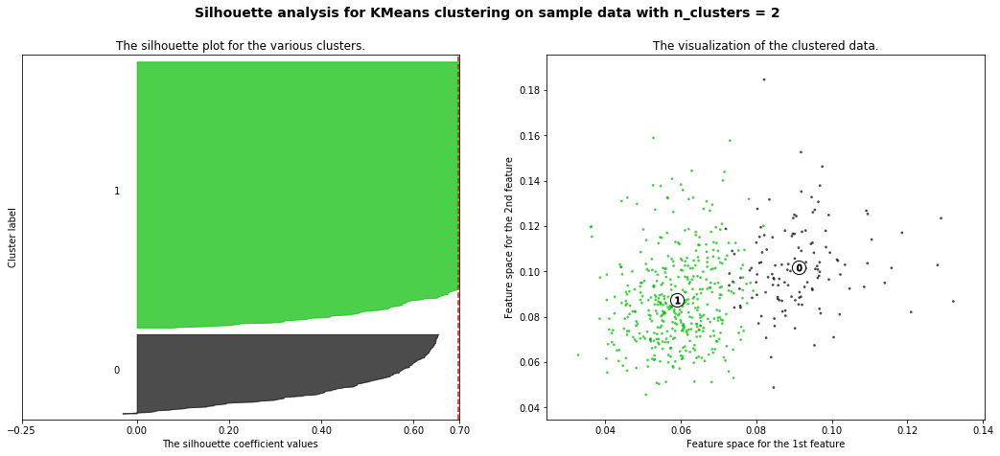

NMI score: 0.461076
For n_clusters = 3 The average silhouette_score is : 0.666020162026


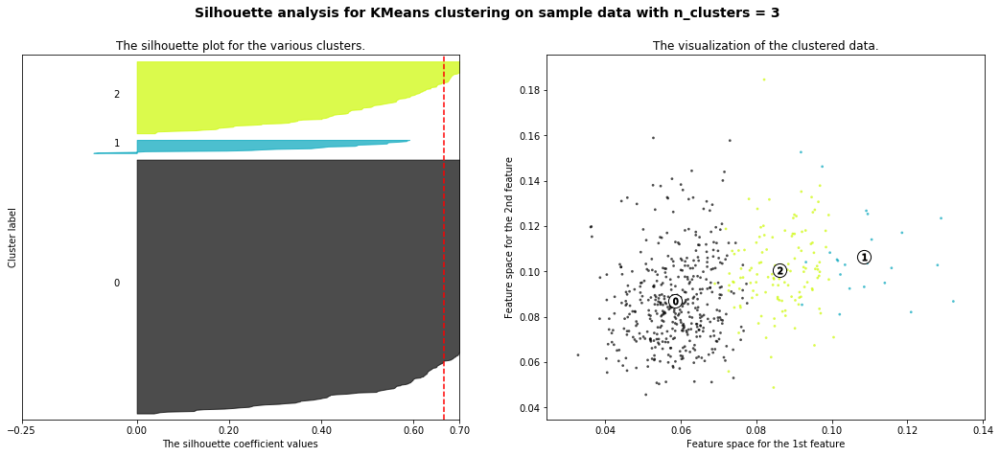

NMI score: 0.437779
For n_clusters = 4 The average silhouette_score is : 0.533461473712


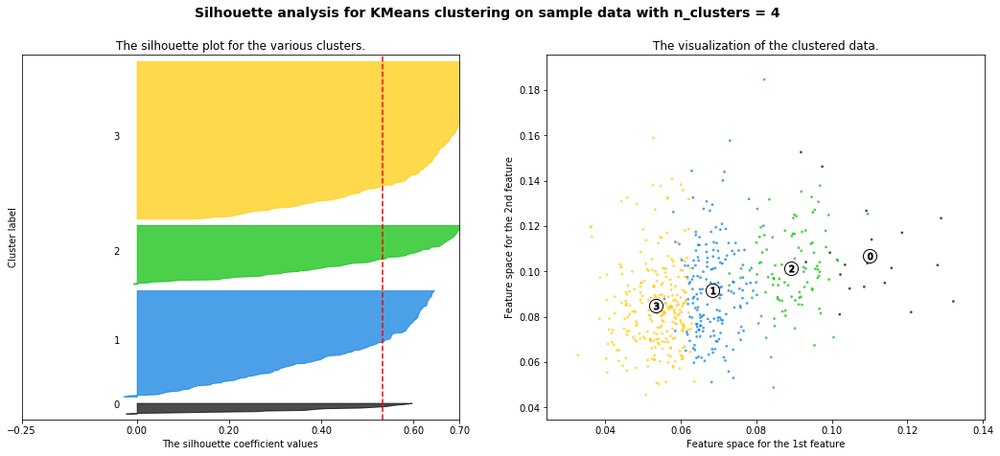

NMI score: 0.423354
For n_clusters = 5 The average silhouette_score is : 0.510229299791


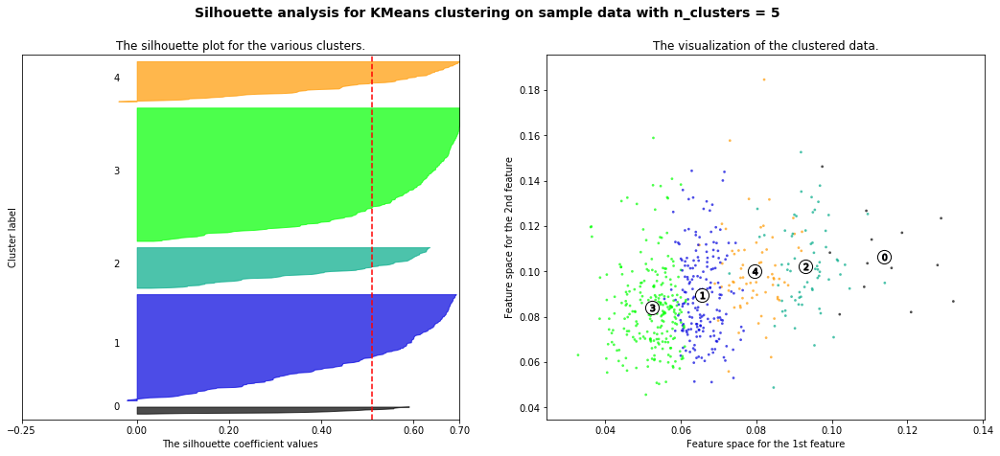

NMI score: 0.417898
For n_clusters = 6 The average silhouette_score is : 0.485792243595


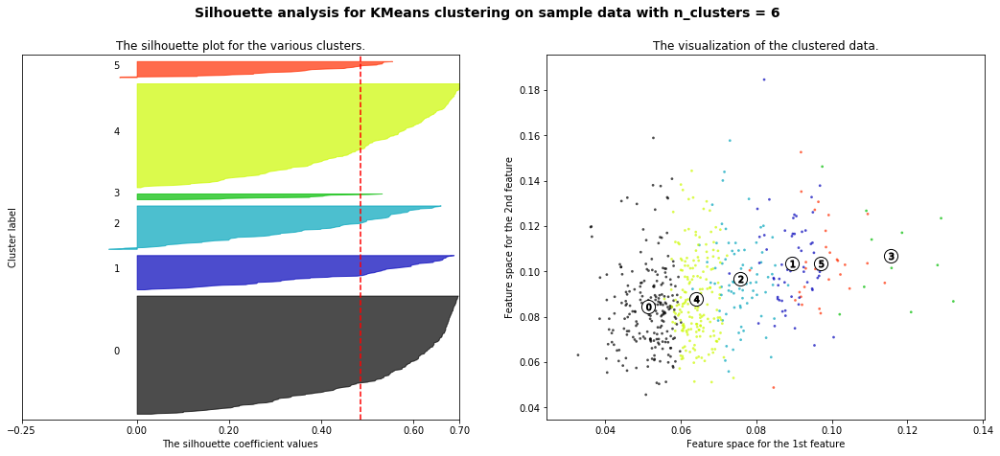

NMI score: 0.395262
For n_clusters = 7 The average silhouette_score is : 0.467624105748


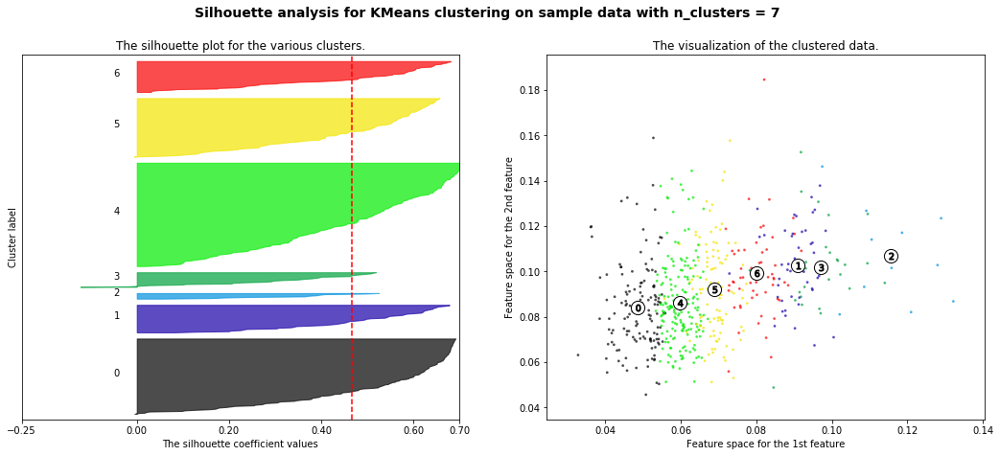

NMI score: 0.394704
For n_clusters = 8 The average silhouette_score is : 0.468245651834


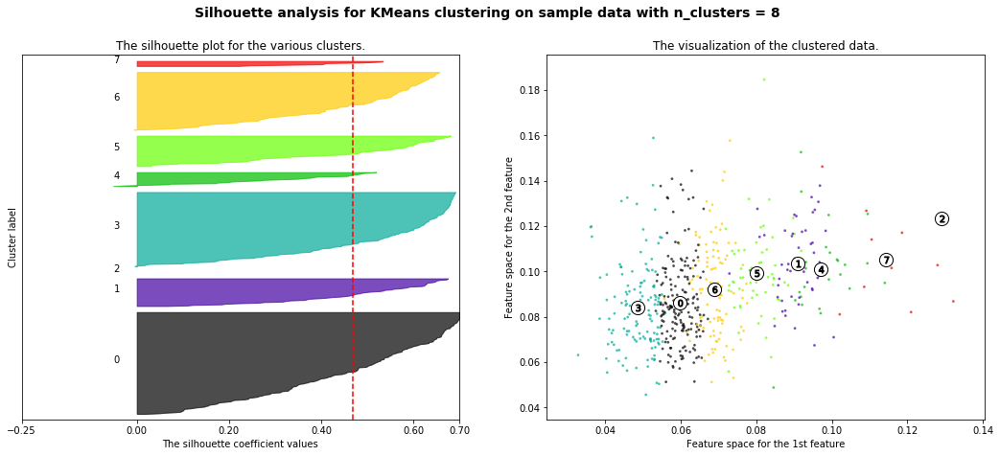

In [5]:
K_MEANS(X_norm,y,'kmeans')

we found that projected space whose axis are  and   gives the best visualization

## Expectation Maximization 

In [6]:
def Expectation_Maximization(X,y,ss):
    for num in range(2,9):
        print("---------------k = ",num," ------------")
        t0 = time()
        clusterer = EM(n_components=num, random_state=10)
        clusterer.fit(X)
        cluster_labels = clusterer.predict(X)
        #visialize_clustering(kmeans,num)
        print("time: ",time() - t0)
        print("Adjusted Rand index: ",metrics.adjusted_rand_score(np.array(y), cluster_labels))
        print("Homogeneity: ",metrics.homogeneity_score(np.array(y), cluster_labels))
        print("completeness: ",metrics.completeness_score(np.array(y), cluster_labels))
        print("V-measure: ",metrics.v_measure_score(np.array(y),cluster_labels))
        print("Mutual Information: ",metrics.adjusted_mutual_info_score(np.array(y),cluster_labels))
        print("Silhouette Coefficient: ",metrics.silhouette_score(X,cluster_labels, metric='euclidean'))
        
    for n_clusters in range(2,9):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.25, 0.7])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_norm) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = EM(n_components=n_clusters, random_state=10)
        clusterer.fit(X)
        cluster_labels = clusterer.predict(X)
        print("NMI score: %.6f" % normalized_mutual_info_score(y, cluster_labels))

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X_norm, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_norm, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.25, 0, 0.2, 0.4, 0.6, 0.7])

        # 2nd Plot showing the actual clusters formed
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter( X_norm[:, 0], X_norm[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.means_

        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for Expectation Maximization clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
        plt.savefig("./figures/cancer/%s/K=%s.jpg"%(ss,n_clusters))
        plt.show()

---------------k =  2  ------------
time:  0.0330815315246582
Adjusted Rand index:  0.705528151945
Homogeneity:  0.595593656911
completeness:  0.634368223166
V-measure:  0.614369755654
Mutual Information:  0.595052853219
Silhouette Coefficient:  0.605347347957
---------------k =  3  ------------
time:  0.029723644256591797
Adjusted Rand index:  0.719013332176
Homogeneity:  0.682683944
completeness:  0.544013115671
V-measure:  0.60551057242
Mutual Information:  0.543033206051
Silhouette Coefficient:  0.49458671306
---------------k =  4  ------------
time:  0.029471874237060547
Adjusted Rand index:  0.466176201327
Homogeneity:  0.622160893789
completeness:  0.358555396561
V-measure:  0.454931050279
Mutual Information:  0.357056630461
Silhouette Coefficient:  0.418930034511
---------------k =  5  ------------
time:  0.043111562728881836
Adjusted Rand index:  0.334059034834
Homogeneity:  0.614225545549
completeness:  0.298859305711
V-measure:  0.402080967261
Mutual Information:  0.29700855

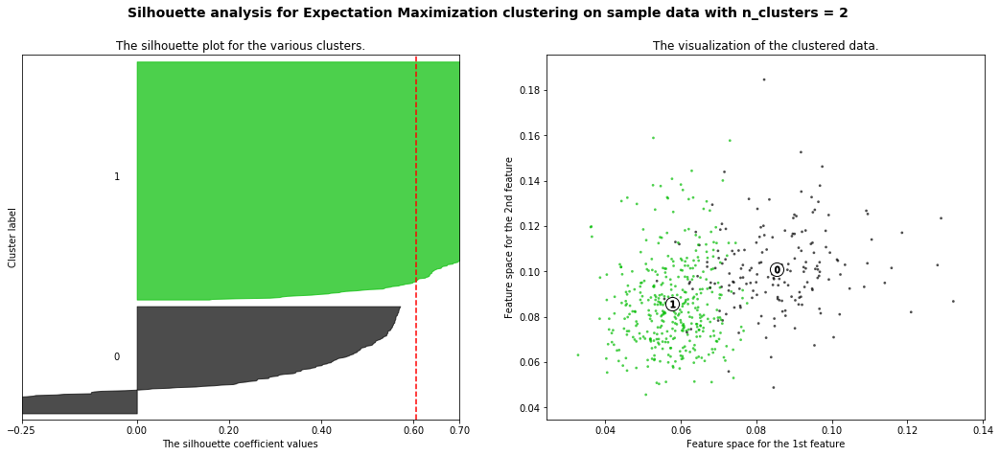

NMI score: 0.609417
For n_clusters = 3 The average silhouette_score is : 0.49458671306


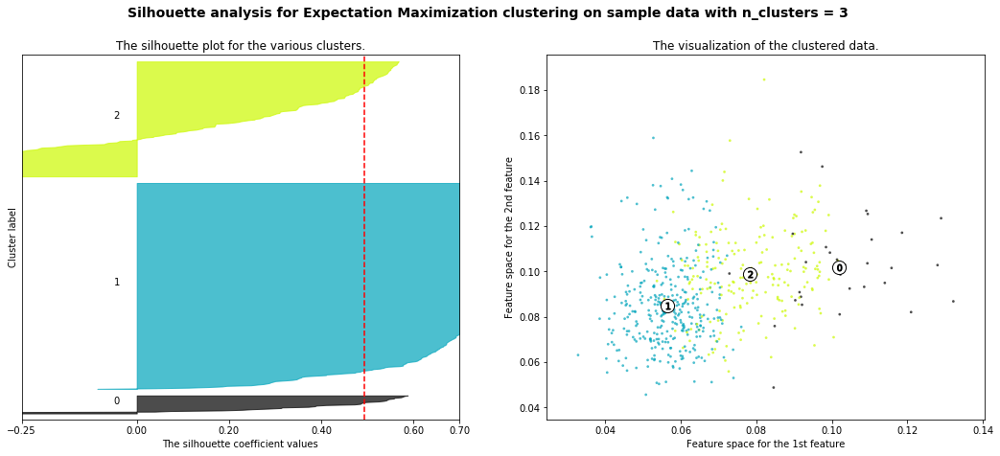

NMI score: 0.472313
For n_clusters = 4 The average silhouette_score is : 0.418930034511


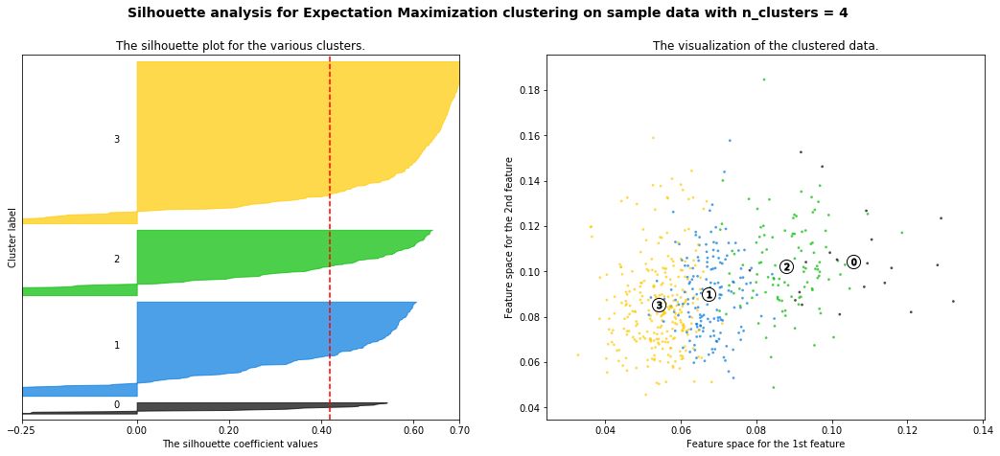

NMI score: 0.428447
For n_clusters = 5 The average silhouette_score is : 0.353610117777


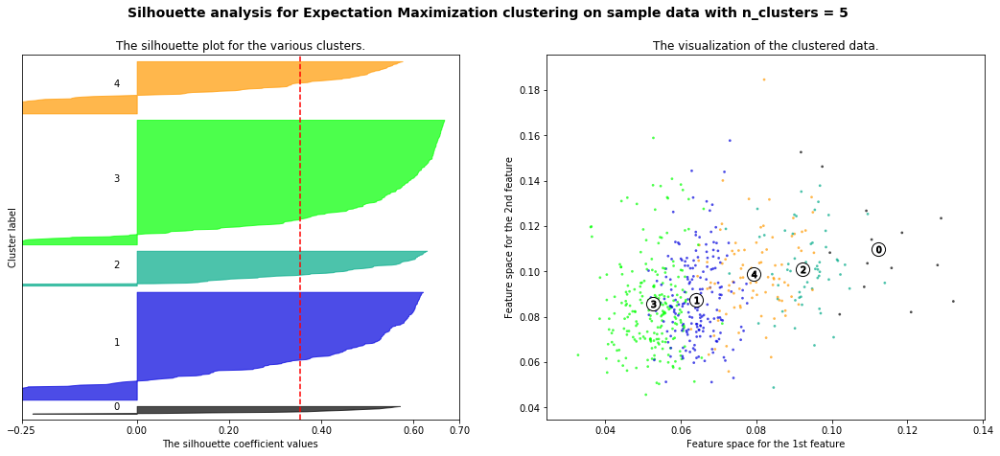

NMI score: 0.455786
For n_clusters = 6 The average silhouette_score is : 0.293109140767


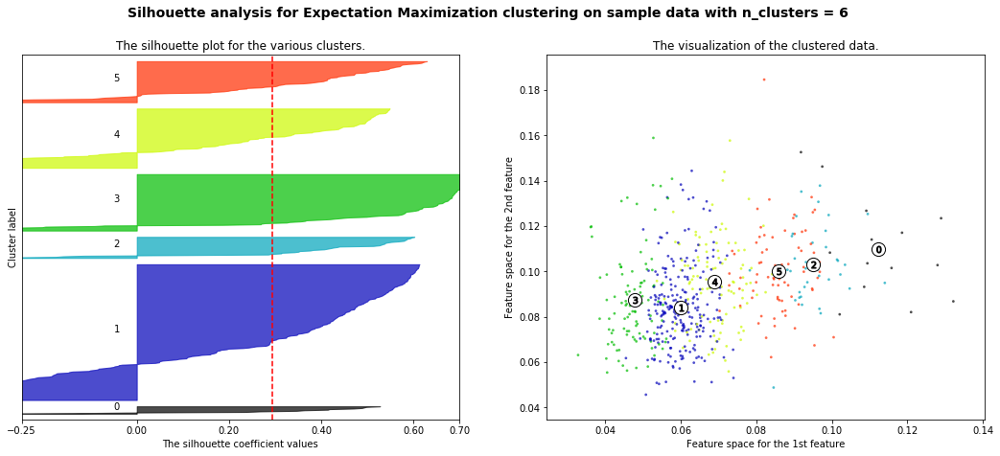

NMI score: 0.450335
For n_clusters = 7 The average silhouette_score is : 0.283667734132


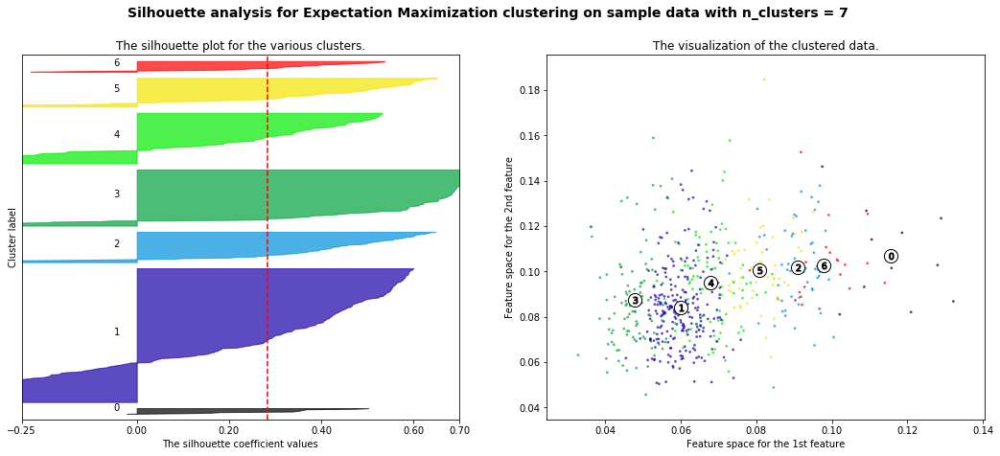

NMI score: 0.443679
For n_clusters = 8 The average silhouette_score is : 0.282300210978


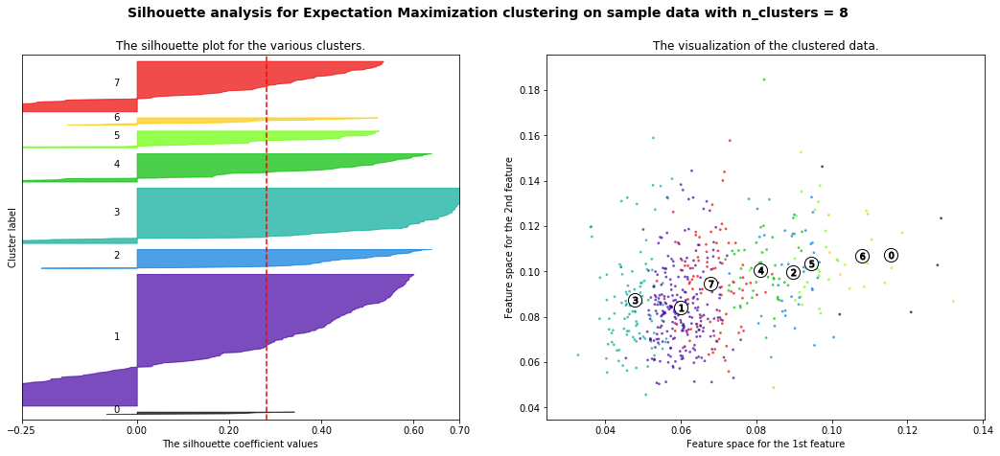

In [7]:
Expectation_Maximization(X,y,"EM")

# Dimensionality Reduction

## PCA

In [8]:
from sklearn.decomposition import PCA

In [9]:
len(np.unique(y))

2

In [10]:
def visialize_PCA(X_r,noc):
    plt.figure()
    colors = [cm.spectral(float(i) / 2) for i in range(2)]
    lw = 2
    for m in range(0,noc - 1):
        for n in range(m,noc):
            for color, i in zip(colors, [i for i in range (2)]):
                plt.scatter(X_r[y == i, m], X_r[y == i, n], color=color, s=1,
                            label=i)
                plt.xlabel('%s principal component'%(n))
                plt.ylabel('%s principal component'%(m))
                plt.title('Visualizaion of principal component analysis on breast cancer ')
            plt.legend(scatterpoints=1)
            plt.savefig('./figures/cancer/PCA/noc=%s_%s_%s.png'%(noc,m,n))
            plt.show()

num of components: 2 reconstruction loss 0.000591228577297
[ 9.80923853  0.16158027]


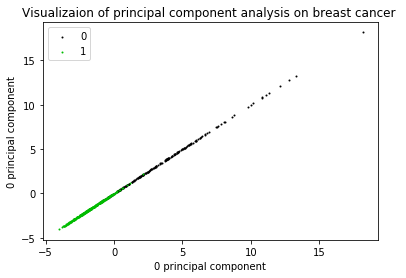

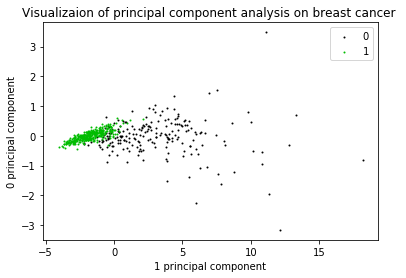

num of components: 4 reconstruction loss 3.33683643212e-05
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03]


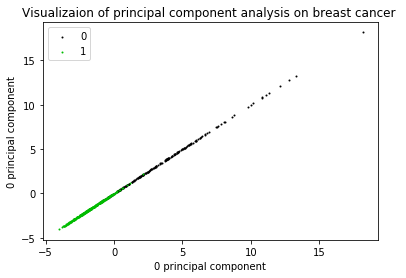

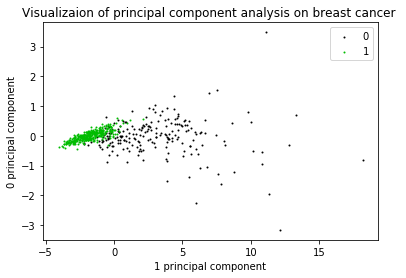

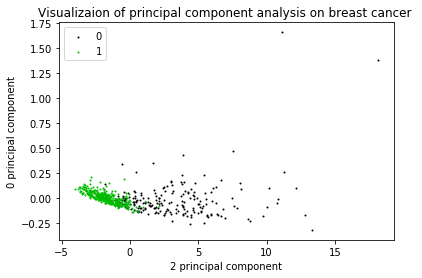

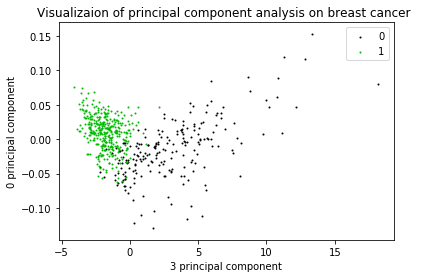

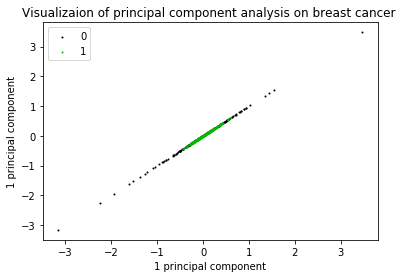

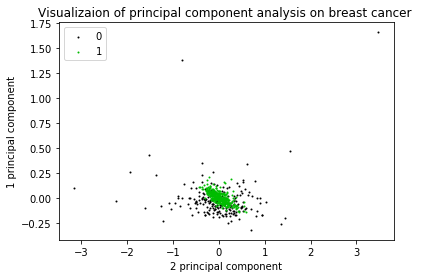

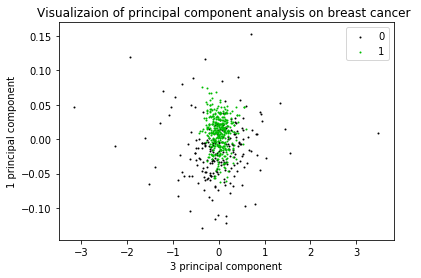

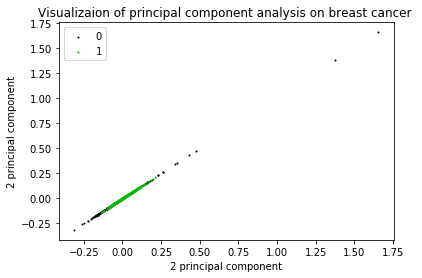

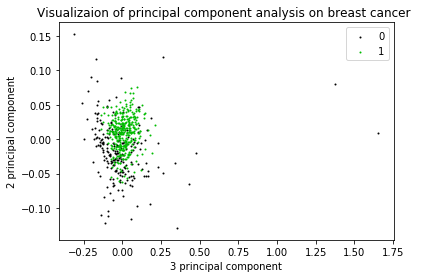

num of components: 6 reconstruction loss 1.81958847493e-06
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03
   8.81717073e-04   6.64125112e-05]


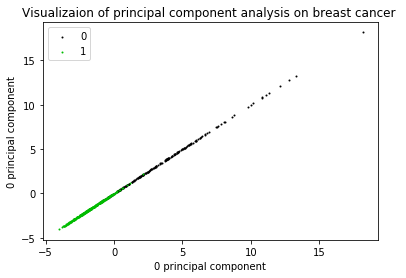

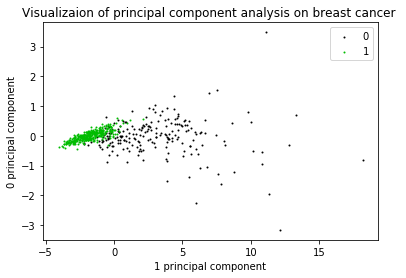

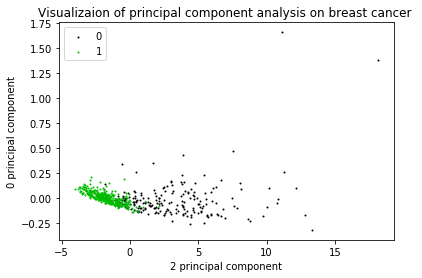

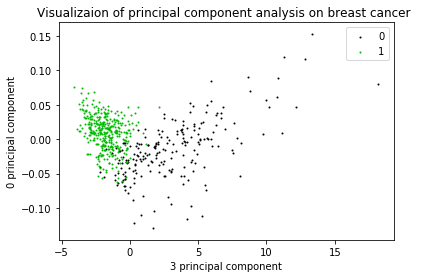

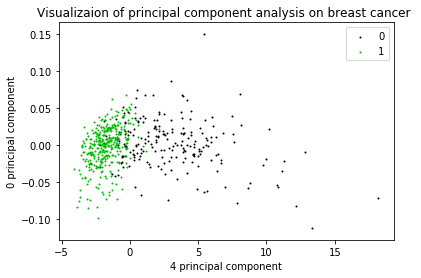

...

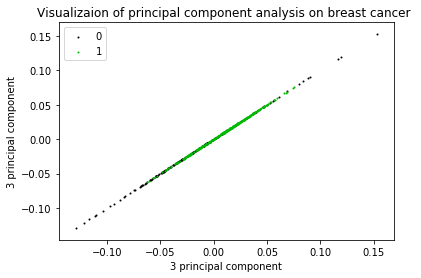

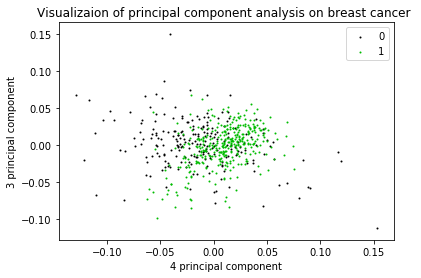

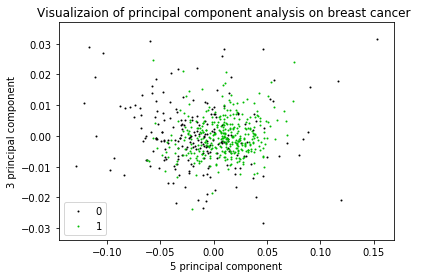

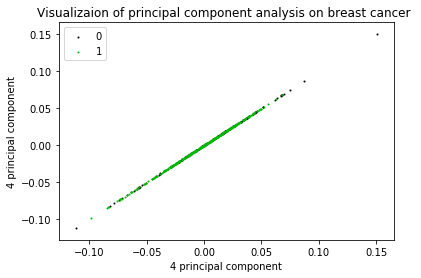

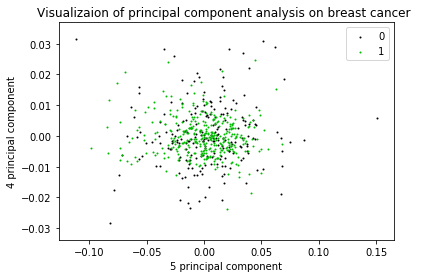

num of components: 8 reconstruction loss 2.11209781611e-07
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03
   8.81717073e-04   6.64125112e-05   4.01255202e-05   8.21079020e-06]


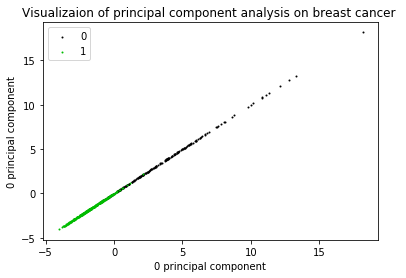

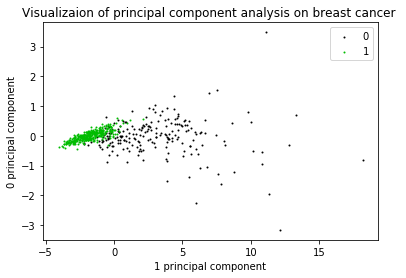

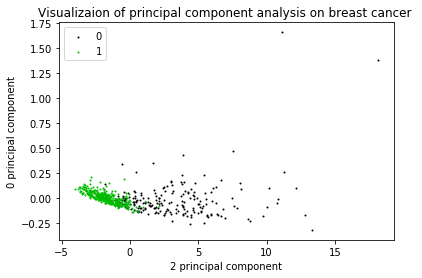

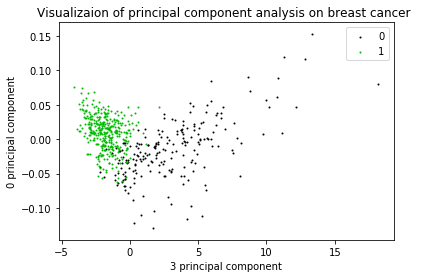

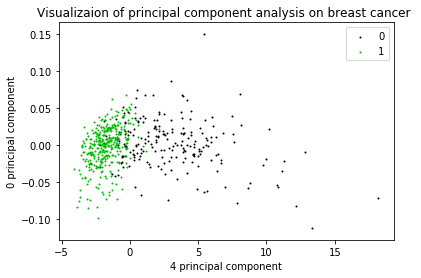

...

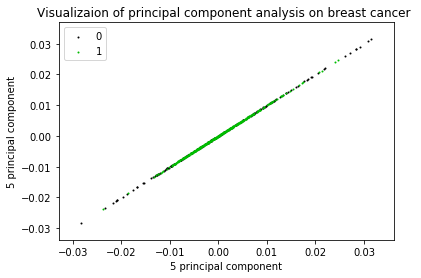

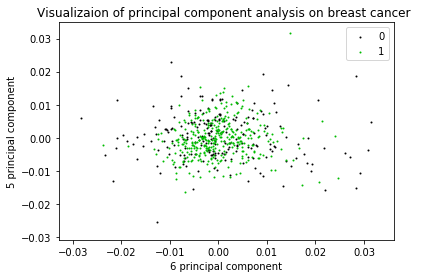

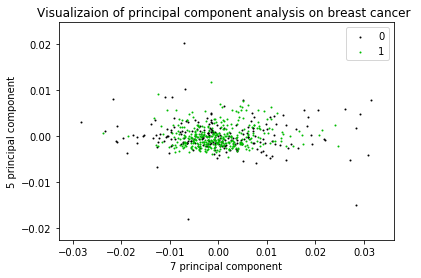

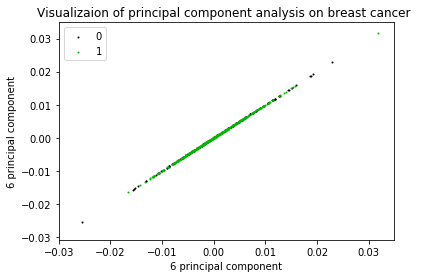

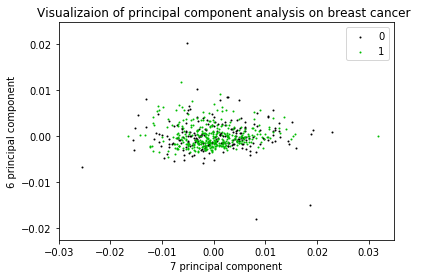

num of components: 10 reconstruction loss 3.5003693733e-08
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03
   8.81717073e-04   6.64125112e-05   4.01255202e-05   8.21079020e-06
   3.43742513e-06   1.85806416e-06]


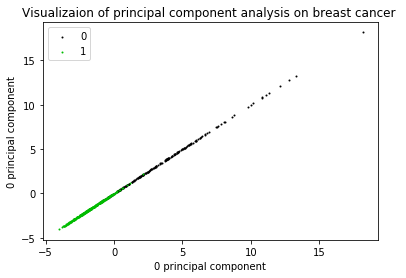

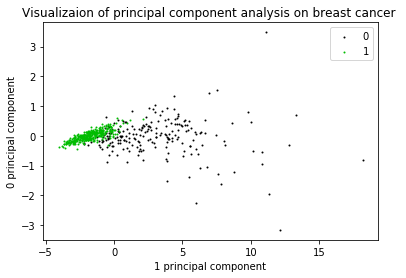

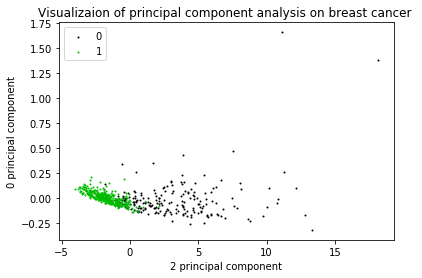

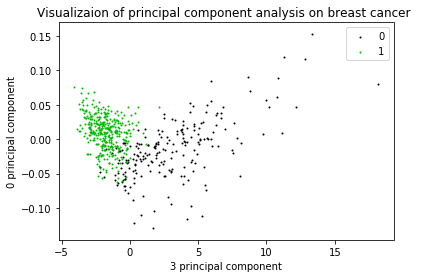

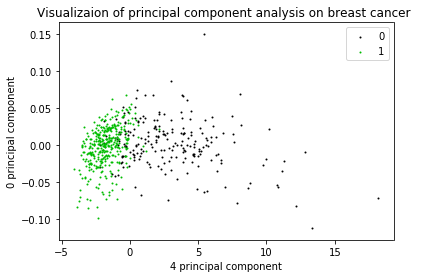

...

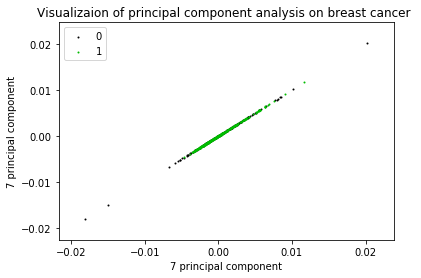

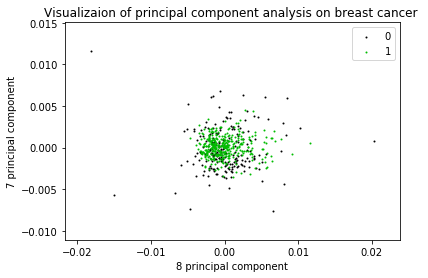

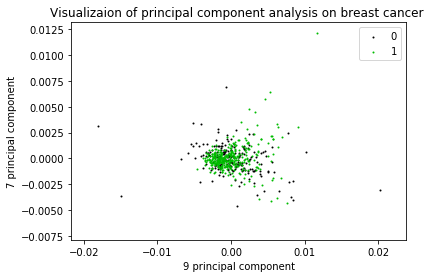

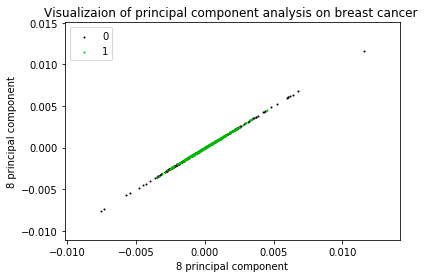

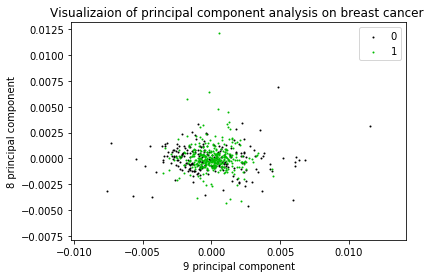

num of components: 12 reconstruction loss 6.24118478484e-09
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03
   8.81717073e-04   6.64125112e-05   4.01255202e-05   8.21079020e-06
   3.43742513e-06   1.85806416e-06   6.98674889e-07   1.65719526e-07]


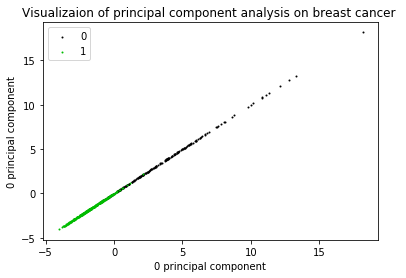

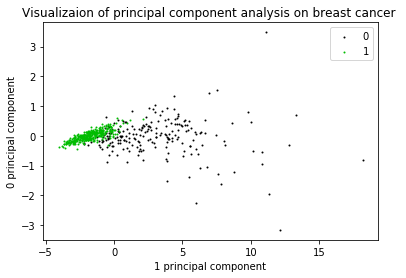

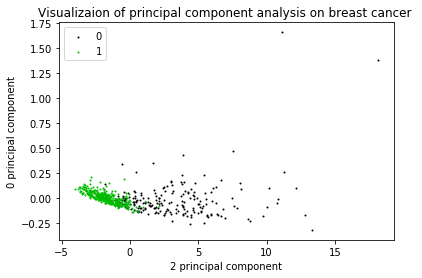

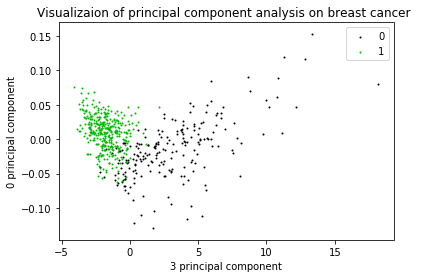

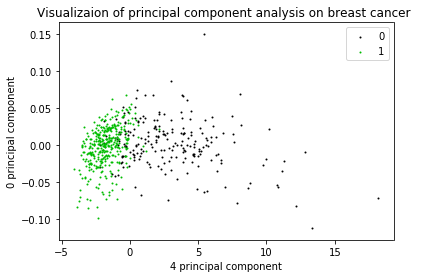

...

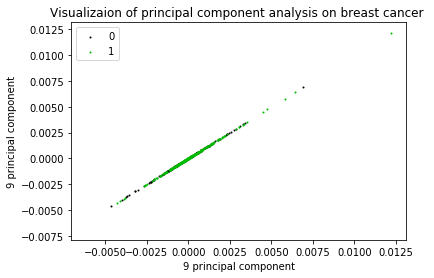

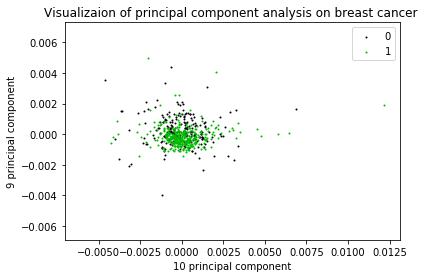

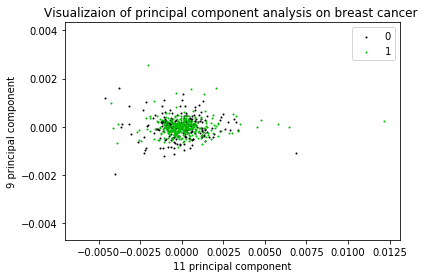

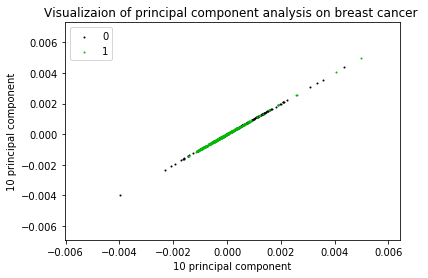

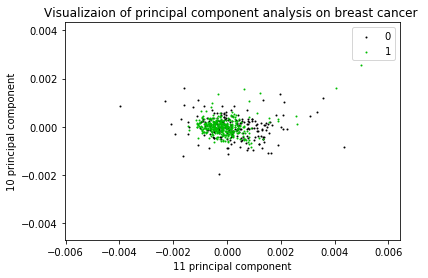

num of components: 14 reconstruction loss 2.32602588057e-09
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03
   8.81717073e-04   6.64125112e-05   4.01255202e-05   8.21079020e-06
   3.43742513e-06   1.85806416e-06   6.98674889e-07   1.65719526e-07
   6.98843141e-08   4.77772396e-08]


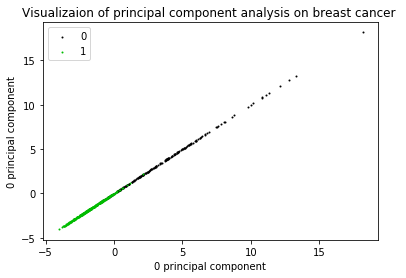

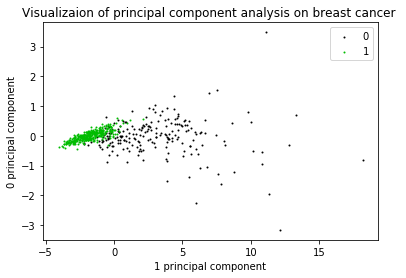

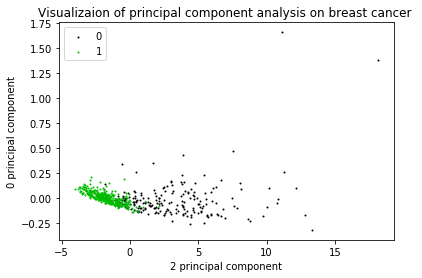

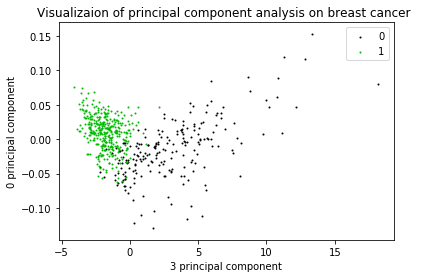

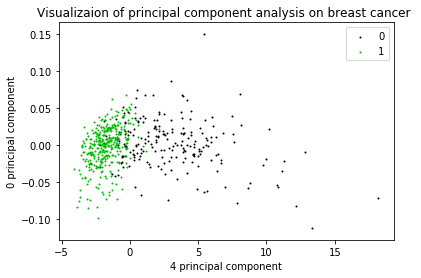

...

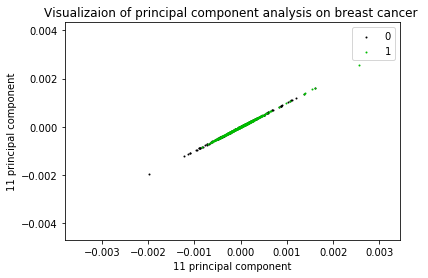

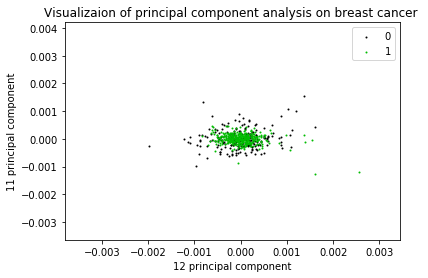

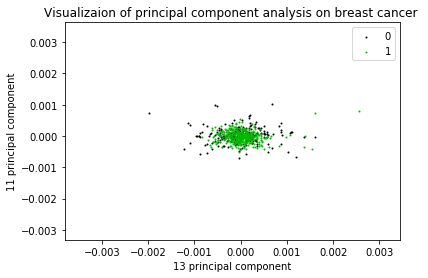

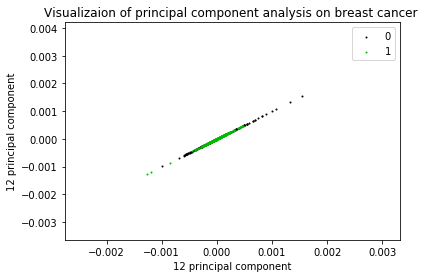

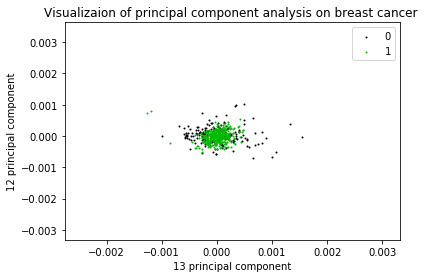

num of components: 16 reconstruction loss 8.79447995635e-10
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03
   8.81717073e-04   6.64125112e-05   4.01255202e-05   8.21079020e-06
   3.43742513e-06   1.85806416e-06   6.98674889e-07   1.65719526e-07
   6.98843141e-08   4.77772396e-08   2.93214183e-08   1.41523220e-08]


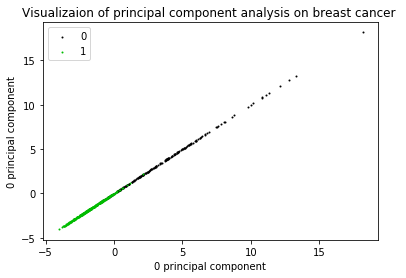

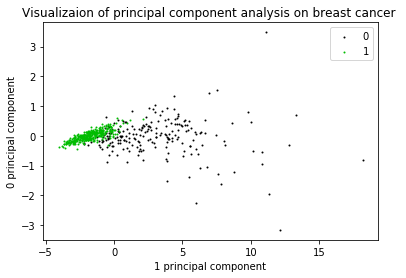

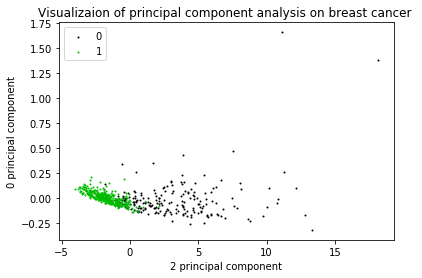

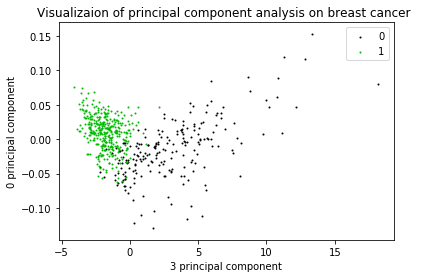

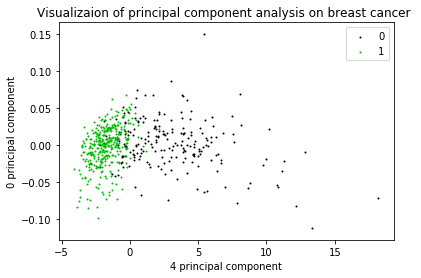

...

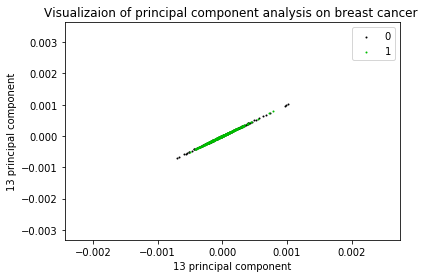

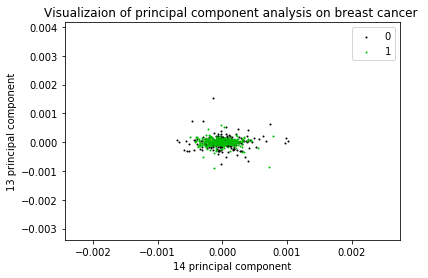

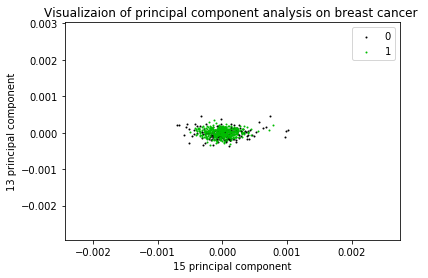

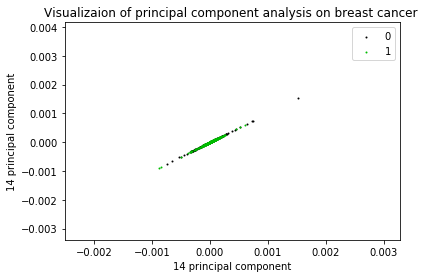

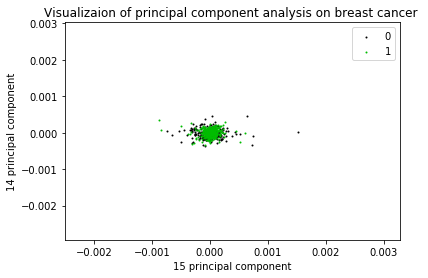

num of components: 18 reconstruction loss 4.30756990276e-10
[  9.80923853e+00   1.61580275e-01   1.55573314e-02   1.20793943e-03
   8.81717073e-04   6.64125112e-05   4.01255202e-05   8.21079020e-06
   3.43742513e-06   1.85806416e-06   6.98674889e-07   1.65719526e-07
   6.98843141e-08   4.77772396e-08   2.93214183e-08   1.41523220e-08
   8.28630925e-09   5.19811938e-09]


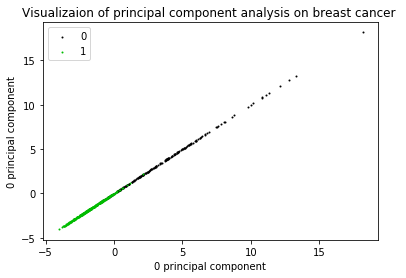

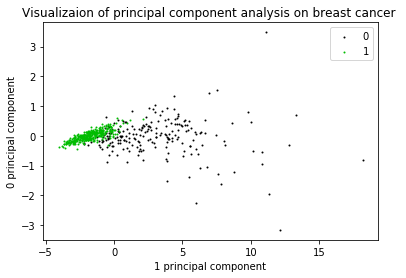

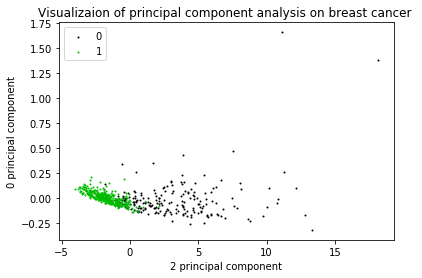

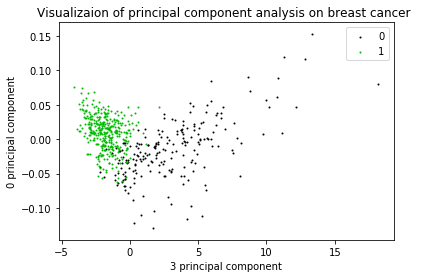

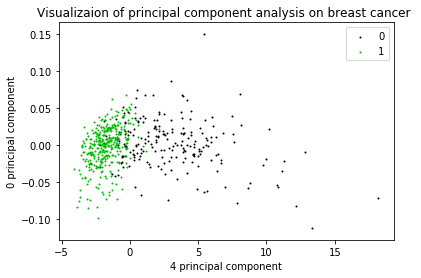

...

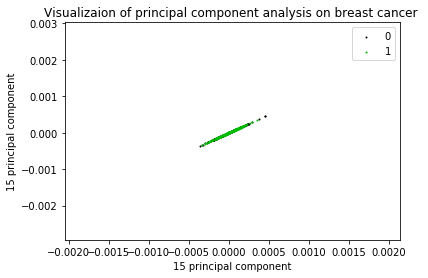

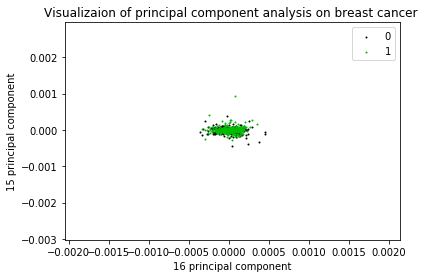

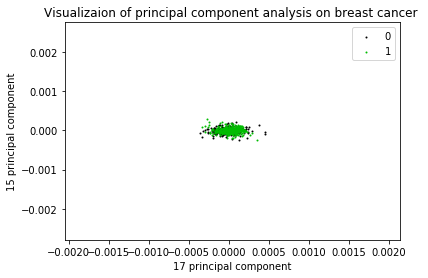

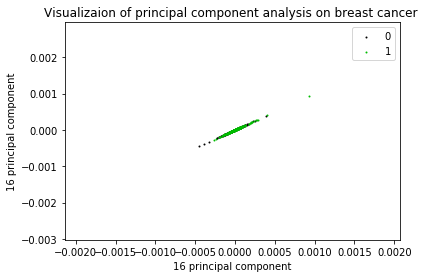

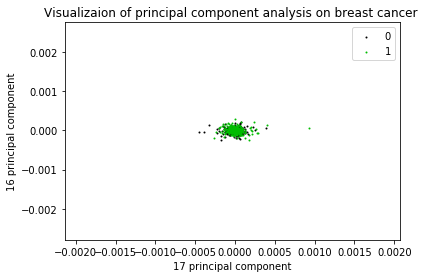

In [11]:
for num_components in range(2, 20, 2):
    pca = PCA(num_components)
    X_r = pca.fit(X).transform(X)
    loss = ((X-pca.inverse_transform(X_r))**2).mean().mean()
    print("num of components: %s reconstruction loss %s"%(num_components,loss))
    print(pca.explained_variance_)
    visialize_PCA(X_r,num_components)

## ICA

In [12]:
from sklearn.decomposition import FastICA as ICA
from scipy.stats import kurtosis

In [13]:
def visialize_ICA(X_r,noc):
    plt.figure()
    colors = [cm.spectral(float(i) / 2) for i in range(2)]
    lw = 2
    for m in range(0,noc - 1):
        for n in range(m,noc):
            for color, i in zip(colors, [i for i in range (2)]):
                plt.scatter(X_r[y == i, m], X_r[y == i, n], color=color, s=1,
                            label=i)
                plt.xlabel('%s principal component'%(n))
                plt.ylabel('%s principal component'%(m))
                plt.title('Visualizaion of independent component analysis on breast cancer ')
            plt.legend(scatterpoints=1)
            plt.savefig('./figures/cancer/ICA/noc=%s_%s_%s.png'%(noc,m,n))
            plt.show()

In [14]:
for num_components in range(2, 20, 2):
    ica = ICA(n_components=num_components)
    X_r = ica.fit(X).transform(X)
    loss = ((X-ica.inverse_transform(X_r))**2).mean().mean()
    k = kurtosis(X_r, axis=1, fisher=False).mean()
    print("num of components: %s reconstruction loss: %s kurtosis: %s"%(num_components,loss,k))
#     print(pca.explained_variance_)
#     visialize_ICA(X_r,num_components)

num of components: 2 reconstruction loss: 0.000591228577297 kurtosis: 1.0
num of components: 4 reconstruction loss: 3.33683643212e-05 kurtosis: 1.78340093926
num of components: 6 reconstruction loss: 1.81958847493e-06 kurtosis: 2.33320316368
num of components: 8 reconstruction loss: 2.11209781611e-07 kurtosis: 2.67689053968
num of components: 10 reconstruction loss: 3.5003693733e-08 kurtosis: 2.98484658661
num of components: 12 reconstruction loss: 6.24118478484e-09 kurtosis: 3.33162890498
num of components: 14 reconstruction loss: 2.32602588057e-09 kurtosis: 3.40597359801
num of components: 16 reconstruction loss: 8.79447995635e-10 kurtosis: 3.78580333268
num of components: 18 reconstruction loss: 4.30756990276e-10 kurtosis: 4.00671434176


## Randomized Projection 

In [15]:
from sklearn.random_projection import GaussianRandomProjection as RP
from sklearn.utils.extmath import safe_sparse_dot as ssd

In [16]:
def visialize_RP(X_r,noc):
    plt.figure()
    colors = [cm.spectral(float(i) / 7) for i in range(2)]
    lw = 2
    for m in range(0,noc - 1):
        for n in range(m,noc):
            for color, i in zip(colors, [i for i in range (2)]):
                plt.scatter(X_r[y == i, m], X_r[y == i, n], color=color, s=1,
                            label=i)
                plt.xlabel('%s principal component'%(n))
                plt.ylabel('%s principal component'%(m))
                plt.title('Visualizaion of randomized projection on breast cancer ')
            plt.legend(scatterpoints=1)
            plt.savefig('./figures/cancer/RP/noc=%s_%s_%s.png'%(noc,m,n))
            plt.show()

In [17]:
for num_components in range(2, 20, 2):
    loss_list = list()
    for i in range(13 - num_components):
        rp = RP(n_components=num_components)
        X_r = rp.fit(X).transform(X)
        loss = ((X-ssd(X_r, np.linalg.pinv(rp.components_).T))**2).mean().mean()
        loss_list.append(loss)
    print("num of components: %s reconstruction loss: %s loss variance: %s"%(num_components,np.mean(loss_list),np.var(loss_list)))
    #visialize_RP(X_r,num_components)

num of components: 2 reconstruction loss: 1.16997859996 loss variance: 0.00228375147525
num of components: 4 reconstruction loss: 1.04867301691 loss variance: 0.009608924726
num of components: 6 reconstruction loss: 0.990648772779 loss variance: 0.0109910926265
num of components: 8 reconstruction loss: 0.818810360045 loss variance: 0.0283569414066
num of components: 10 reconstruction loss: 0.896360230096 loss variance: 0.00978289191835
num of components: 12 reconstruction loss: 0.703224035096 loss variance: 0.0
num of components: 14 reconstruction loss: nan loss variance: nan
num of components: 16 reconstruction loss: nan loss variance: nan
num of components: 18 reconstruction loss: nan loss variance: nan


/home/jimmy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/jimmy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/jimmy/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3146: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/home/jimmy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/jimmy/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


## LinearDiscriminantAnalysis

Results of randomized projections on breast cancer data
time	accuracy
0.00s	0.965


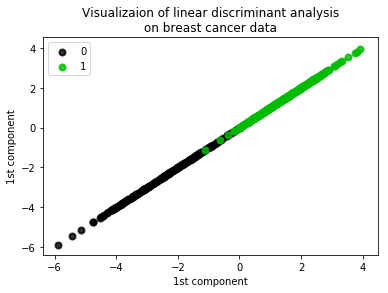

In [18]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
def LDA_analysis(X, y, n, target_names, data_name):
    
    print('Results of randomized projections on %s data' % data_name)
    print('time\taccuracy')
      
    lda = LDA()
    t0 = time()
    X_r = lda.fit(X, y).transform(X)
    print('%.2fs\t%.3f'
              % (time()-t0, lda.score(X, y)))
        
    plt.figure()
    colors = [cm.spectral(float(i) / n) for i in range(n)]
    lw = 2

    for color, i, target_name in zip(colors, [i for i in range (n)], target_names):
            plt.scatter(X_r[y == i, 0], X_r[y == i, 0], color=color, alpha=.8, lw=lw,
                        label=target_name)
    plt.xlabel('1st component')
    plt.ylabel('1st component')
    plt.title('Visualizaion of linear discriminant analysis\non %s data' % data_name)
    plt.legend(loc='best', shadow=False, scatterpoints=1)
    plt.show()
    

LDA_analysis(X,y,2,[0,1],'breast cancer')

# Cluster on the transformed data

In [19]:
def PCA_transform(x_train, y_train, x_test=None, y_test=None):
    clf = PCA(n_components = 8).fit(x_train, y_train)
    x_train_pca = clf.transform(x_train)
    if y_test is not None:
        x_test_pca = clf.transform(x_test)
    else:
        x_test_pca = None
    return x_train_pca, y_train, x_test_pca, y_test

def ICA_transform(x_train, y_train, x_test=None, y_test=None):
    clf = ICA(n_components = 8).fit(x_train, y_train)
    x_train_ica = clf.transform(x_train)
    if y_test is not None:
        x_test_ica = clf.transform(x_test)
    else:
        x_test_ica = None
    return x_train_ica, y_train, x_test_ica, y_test

def RP_transform(x_train, y_train, x_test=None, y_test=None):
    clf = RP(n_components = 8).fit(x_train, y_train)
    x_train_rp = clf.transform(x_train)
    if y_test is not None:
        x_test_rp = clf.transform(x_test)
    else:
        x_test_rp = None
    return x_train_rp, y_train, x_test_rp, y_test

def LDA_transform(x_train, y_train, x_test=None, y_test=None):
    clf = LDA(n_components = 8).fit(x_train, y_train)
    x_train_lda = clf.transform(x_train)
    if y_test is not None:
        x_test_lda = clf.transform(x_test)
    else:
        x_test_lda = None
    return x_train_lda, y_train, x_test_lda, y_test

In [20]:
X_PCA,y_PCA,_,_ = PCA_transform(X,y)
X_ICA,y_ICA,_,_ = ICA_transform(X,y)
X_RP,y_RP,_,_ = RP_transform(X,y)
X_LDA,y_LDA,_,_ = LDA_transform(X,y)

In [21]:
def km(X_test,y,ss,m):
    range_n_clusters = [2]
    for n_clusters in range_n_clusters:
        fig = plt.gcf()
        fig.set_size_inches(7, 7)
        ax = fig.add_subplot(111)
        t0 = time()
        clusterer = KMeans(n_clusters=n_clusters, random_state=10).fit(X_test)
        cluster_labels = clusterer.labels_
        print("time: ",time() - t0)
        silhouette_avg = silhouette_score(X_test, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
        print("The NMI score is: %.6f" % normalized_mutual_info_score(y, cluster_labels))
    
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax.scatter( X_test[:, 0], X_test[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_

        ax.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax.set_title("The visualization of the clustered data.")
        ax.set_xlabel("Feature space for the 1st feature")
        ax.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("KMeans  using %s  "
                  "n_clusters = %d" %(m, n_clusters)),
                 fontsize=14, fontweight='bold')
        plt.savefig('./figures/cancer/%s/k= %s.png'%(ss,n_clusters))
        plt.show()

def em(X_test,y,ss,m):
    range_n_clusters = [2]
    for n_clusters in range_n_clusters:
        fig = plt.gcf()
        fig.set_size_inches(7, 7)
        ax = fig.add_subplot(111)
        t0 = time()
        clusterer = EM(n_components=n_clusters, random_state=10).fit(X_test)
        cluster_labels = clusterer.predict(X_test)
        print("time: ",time() - t0)
        silhouette_avg = silhouette_score(X_test, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
        print("The NMI score is: %.6f" % normalized_mutual_info_score(y, cluster_labels))
    
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax.scatter( X_test[:, 0], X_test[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        centers = clusterer.means_

        ax.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax.scatter( c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax.set_title("The visualization of the clustered data.")
        ax.set_xlabel("Feature space for the 1st feature")
        ax.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("EM using %s "
                  "n_clusters = %d" %(m, n_clusters)),
                 fontsize=14, fontweight='bold')
        plt.savefig('./figures/cancer/%s/k= %s.png'%(ss,n_clusters))
        plt.show()

time:  0.01154184341430664
For n_clusters = 2 The average silhouette_score is : 0.602202395724
The NMI score is: 0.604747


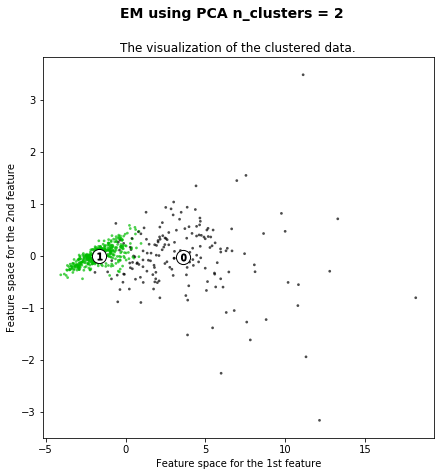

time:  0.008399009704589844
For n_clusters = 2 The average silhouette_score is : 0.653552523528
The NMI score is: 0.042001


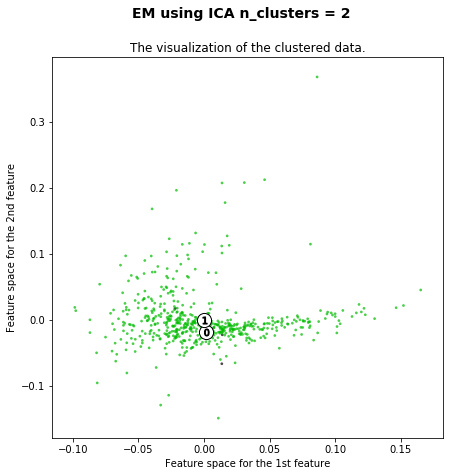

time:  0.007858753204345703
For n_clusters = 2 The average silhouette_score is : 0.617946903441
The NMI score is: 0.582670


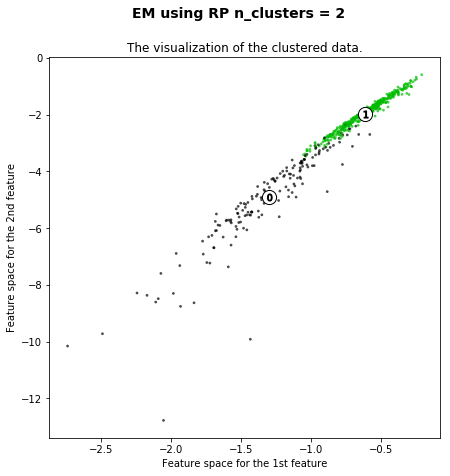

time:  0.01629328727722168
For n_clusters = 2 The average silhouette_score is : 0.697265539251
The NMI score is: 0.467166


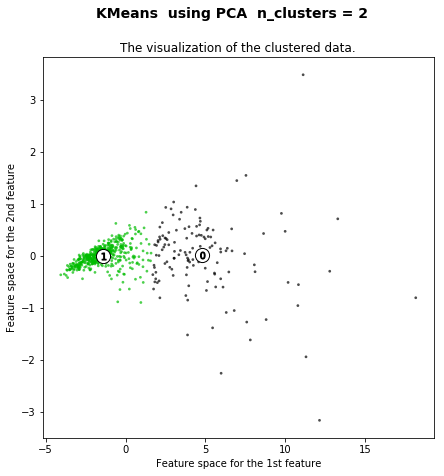

time:  0.022634267807006836
For n_clusters = 2 The average silhouette_score is : 0.788490075719
The NMI score is: 0.028019


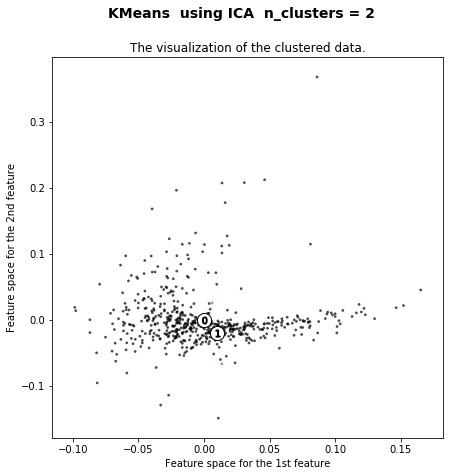

time:  0.015272855758666992
For n_clusters = 2 The average silhouette_score is : 0.702110869518
The NMI score is: 0.443610


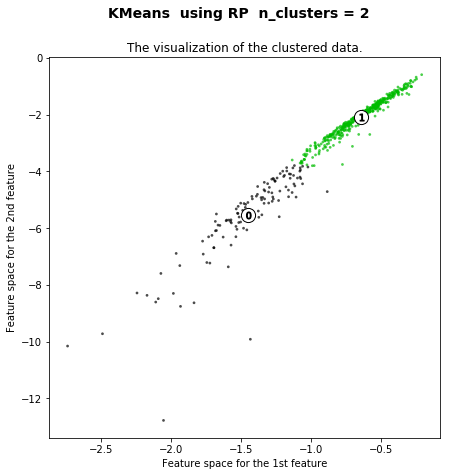

In [22]:
em(X_PCA,y_PCA,"EM_PCA","PCA")
em(X_ICA,y_ICA,"EM_ICA","ICA")
em(X_RP,y_RP,"EM_RP","RP")
km(X_PCA,y_PCA,'kmeans_PCA',"PCA")
km(X_ICA,y_ICA,'kmeans_ICA',"ICA")
km(X_RP,y_RP,'kmeans_RP',"RP")

In [26]:
def km(X_test,y,ss,m):
    range_n_clusters = [2]
    for n_clusters in range_n_clusters:
        fig = plt.gcf()
        fig.set_size_inches(7, 7)
        ax = fig.add_subplot(111)
        t0 = time()
        clusterer = KMeans(n_clusters=n_clusters, random_state=10).fit(X_test)
        cluster_labels = clusterer.labels_
        print("time: ",time() - t0)
        silhouette_avg = silhouette_score(X_test, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
        print("The NMI score is: %.6f" % normalized_mutual_info_score(y, cluster_labels))
    
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax.scatter( X_test[:, 0], X_test[:, 0], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_

        ax.scatter(centers[:, 0], centers[:, 0], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax.scatter( c[0], c[0], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax.set_title("The visualization of the clustered data.")
        ax.set_xlabel("Feature space for the 1st feature")
        ax.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("KMeans  using %s  "
                  "n_clusters = %d" %(m, n_clusters)),
                 fontsize=14, fontweight='bold')
        plt.savefig('./figures/cancer/%s/k= %s.png'%(ss,n_clusters))
        plt.show()

def em(X_test,y,ss,m):
    range_n_clusters = [2]
    for n_clusters in range_n_clusters:
        fig = plt.gcf()
        fig.set_size_inches(7, 7)
        ax = fig.add_subplot(111)
        t0 = time()
        clusterer = EM(n_components=n_clusters, random_state=10).fit(X_test)
        cluster_labels = clusterer.predict(X_test)
        print("time: ",time() - t0)
        silhouette_avg = silhouette_score(X_test, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
        print("The NMI score is: %.6f" % normalized_mutual_info_score(y, cluster_labels))
    
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax.scatter( X_test[:, 0], X_test[:, 0], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        centers = clusterer.means_

        ax.scatter(centers[:, 0], centers[:, 0], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax.scatter( c[0], c[0], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax.set_title("The visualization of the clustered data.")
        ax.set_xlabel("Feature space for the 1st feature")
        ax.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("EM using %s "
                  "n_clusters = %d" %(m, n_clusters)),
                 fontsize=14, fontweight='bold')
        plt.savefig('./figures/cancer/%s/k= %s.png'%(ss,n_clusters))
        plt.show()

time:  0.011715888977050781
For n_clusters = 2 The average silhouette_score is : 0.70945447444
The NMI score is: 0.803362


/home/jimmy/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


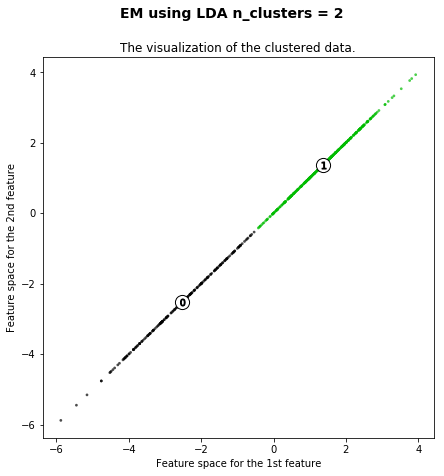

time:  0.015701770782470703
For n_clusters = 2 The average silhouette_score is : 0.71003588824
The NMI score is: 0.788173


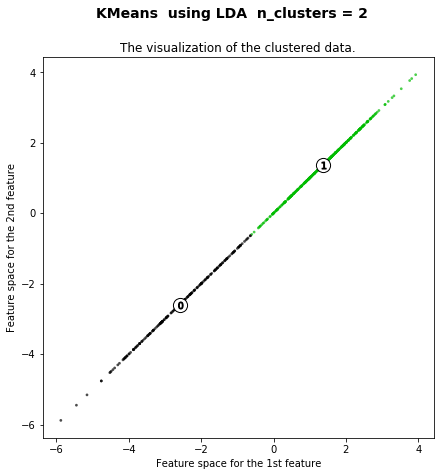

In [27]:
em(X_LDA,y_LDA,"EM_LDA","LDA")
km(X_LDA,y_LDA,"kmeans_LDA","LDA")